In [1]:
import os, sys
os.chdir('/work/OBBDetection')

import os
import sys
import importlib
import glob
import pickle
import mlflow
import mmcv

import numpy as np

import matplotlib.pyplot as plt

import BboxToolkit as bt

from mmdet.core.evaluation.obb.obb_mean_ap import eval_tp_fp

from mmdet.apis import (init_detector,
                        inference_detector,
                        show_result_pyplot)

from IPython.display import (display,
                             Markdown)

DOTA_CLASSES = (
    'large-vehicle', 'swimming-pool', 'helicopter',
    'bridge', 'plane', 'ship', 'soccer-ball-field',
    'basketball-court', 'ground-track-field',
    'small-vehicle', 'baseball-diamond',
    'tennis-court', 'roundabout',
    'storage-tank', 'harbor'
) 

In [2]:
def build_gt_like_result(gtdict,imgfn):
    
    gtdict_img_lst = [
        gtdict['content'][i]['ann']
        for i in range(len(gtdict['content']))
        if gtdict['content'][i]['id'].split('.')[0]==os.path.basename(imgfn).split('.')[0]
    ]
    
    gt = []
    
    print(
        'n_annots',
        gtdict_img_lst[0]['labels']
    )
    
    
    for gtdict_img in gtdict_img_lst:
        
        for label_id in range(15):

            bboxes_prob = np.zeros((0, 6))
            
            for enu,lab in enumerate(gtdict_img['labels']):
                
                if lab==label_id:
                    
                    bbox = np.asarray(
                        [el for el in bt.poly2obb( gtdict_img['bboxes'][enu] )]+[1.0]) # probab=1 since GT
                    bboxes_prob = np.concatenate((bboxes_prob,bbox.reshape((1,6))),axis=0)

            gt.append(bboxes_prob)
        
    return gt

def get_gt_img(gtdict,imgfn):
    
    gtdict_img_lst = [
        gtdict['content'][i]['ann']
        for i in range(len(gtdict['content']))
        if gtdict['content'][i]['id'].split('.')[0]==os.path.basename(imgfn).split('.')[0]
    ]
    
    return gtdict_img_lst[0]

def plot_20_samples(
    artifact_path,
    i=639,
):
    
    config_file = glob.glob(os.path.join(artifact_path,'*.py'))[0]
    checkpoint_file = os.path.join(artifact_path,'latest.pth')
    conf_module = os.path.basename(config_file).replace('.py','')
    
    sys.path.append(artifact_path)
    
    module = importlib.import_module(conf_module)
    
    gtfn = os.path.join(module.data['test']['ann_file'],'patch_annfile.pkl')
    
    if not os.path.isfile(gtfn):
        print('MAKING dataset again...')
        arg = os.path.dirname(module.data['test']['img_prefix'])
        CMD = f'/opt/conda/envs/iqf/bin/python /work/make_ds.py {arg}'
        print(CMD)
        !$CMD
    
    with open(gtfn,'rb') as f:
        gtdict = pickle.load(f)
        
    model = init_detector(
        config_file,
        checkpoint_file,
        device='cpu'
    )
        
    imgfn = glob.glob(os.path.join(module.data['test']['img_prefix'],'*'))[i]
    display(Markdown(f'### NUMBER: {i} , IMG_ID: {os.path.basename(imgfn).split(".")[0]}'))
    # display(Markdown(f'### GROUND TRUTH'))
    # gt = build_gt_like_result(gtdict,imgfn)
    # show_result_pyplot(model, imgfn, gt,fig_size=(15, 15))
    # plt.show()
    # display(Markdown(f'### INFERENCE'))
    result = inference_detector(model, imgfn)
    
    ######################
    ######################
    annots = get_gt_img(gtdict,imgfn)
    
    scores = eval_tp_fp(
        det_results=[[r[r[:,-1]>CONF_THRES] for r in result]],
        annotations=[annots],
        scale_ranges=None,
        iou_thr=iou_thr,
        nproc=4,
    )
    
    AP = scores[0]
    display(Markdown(f'### INFERENCE, AP = {AP}'))
    str_table_lst = []
    str_table_lst.append( '|'+'|'.join(['CLASS','TP','FP','FN'])+'|')
    str_table_lst.append( '|'+'|'.join(['---','---','---','---'])+'|')
    for s,(enu,name) in zip(scores[1],enumerate(DOTA_CLASSES)):
        tp = int((s['TP'][-1] if len(s['TP']) else 0))
        fp = int((s['FP'][-1] if len(s['FP']) else 0))
        fn = int((s['FN'][-1] if len(s['FN']) else 0))
        str_table_lst.append( '|'+'|'.join([name,f'{tp}',f'{fp}',f'{fn}'])+'|' )

    str_table = '\n'.join(str_table_lst)
    display(Markdown(str_table))
    ######################
    ######################
    
    show_result_pyplot(model, imgfn, result,fig_size=(20,20))
    plt.show()
    
    # unimport module
    sys.modules.pop(conf_module)
    # remove module path from syspath
    sys.path.remove(artifact_path)
    
    return result, annots

__________________________________________

# model: fcos - quality: 10

Use load_from_local loader


### NUMBER: 639 , IMG_ID: P0864_0003

/work/OBBDetection/mmdet/apis/inference.py:108: UserWarning: We set use_torchvision=True in CPU mode.
  warnings.warn('We set use_torchvision=True in CPU mode.')
/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /opt/conda/conda-bld/pytorch_1623448265233/work/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


### INFERENCE, AP = 0.44885408878326416

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|0|0|0|
|swimming-pool|0|0|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|146|9|11|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|0|0|0|
|baseball-diamond|0|0|0|
|tennis-court|0|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|2|4|

/work/OBBDetection/mmdet/models/detectors/obb/obb_base.py:71: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


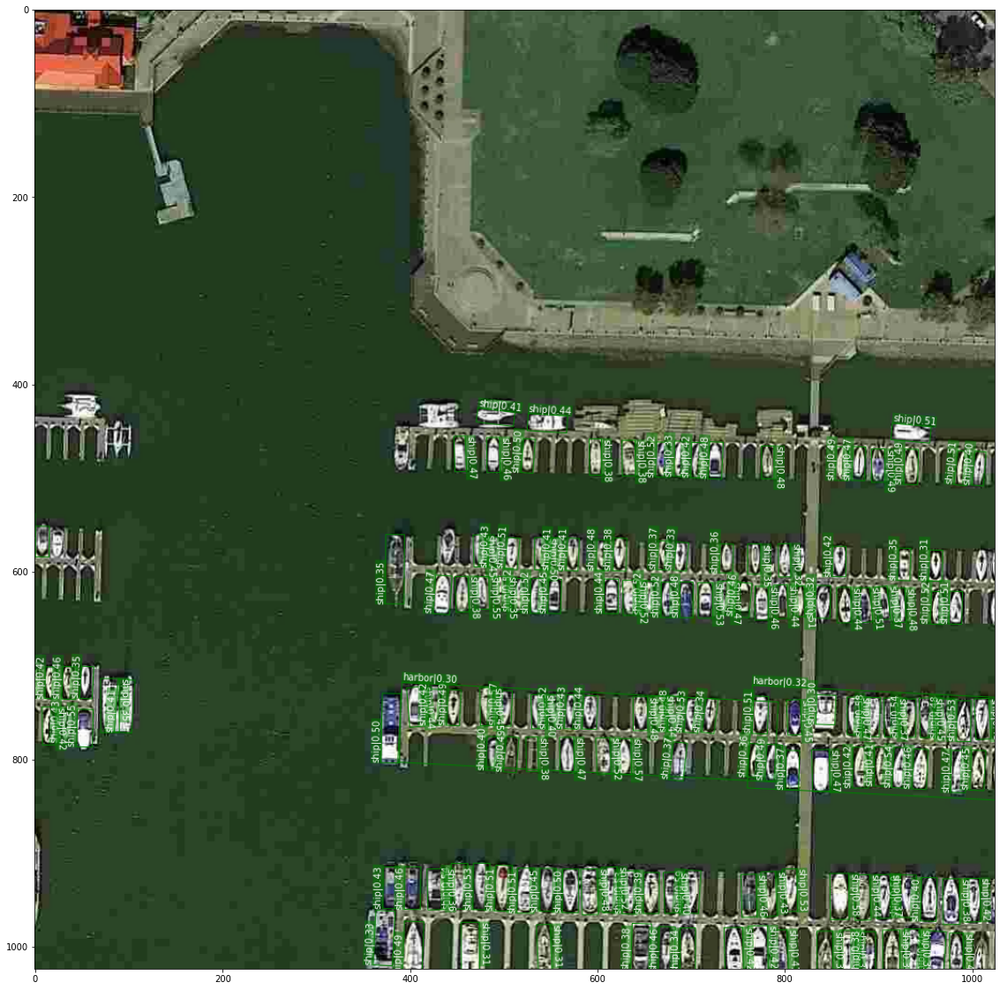

Use load_from_local loader


### NUMBER: 1927 , IMG_ID: P1924_0000

### INFERENCE, AP = 0.8424242734909058

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|28|1|1|
|swimming-pool|0|0|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|0|0|0|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|12|3|2|
|baseball-diamond|0|0|0|
|tennis-court|0|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|0|0|

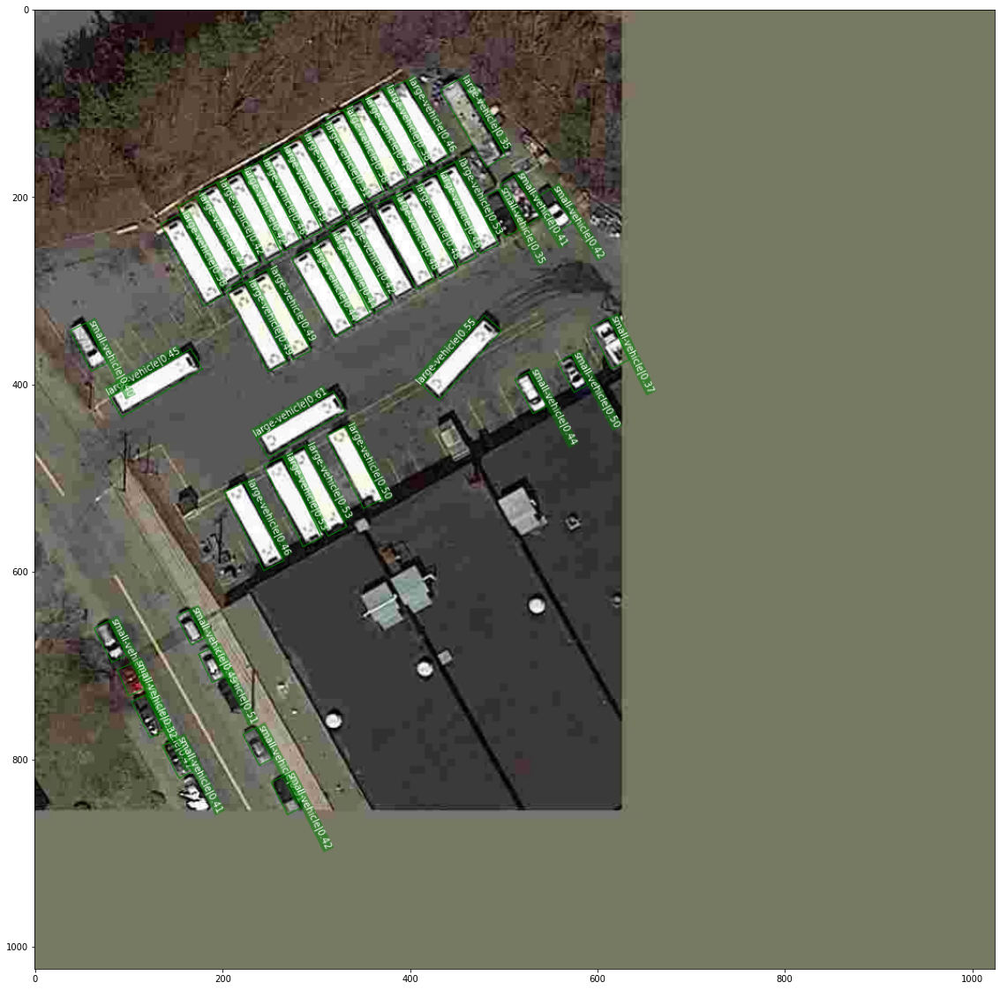

Use load_from_local loader


### NUMBER: 1465 , IMG_ID: P0189_0000

### INFERENCE, AP = 0.718181848526001

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|35|2|1|
|swimming-pool|0|0|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|0|0|0|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|14|1|11|
|baseball-diamond|0|0|0|
|tennis-court|0|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|0|0|

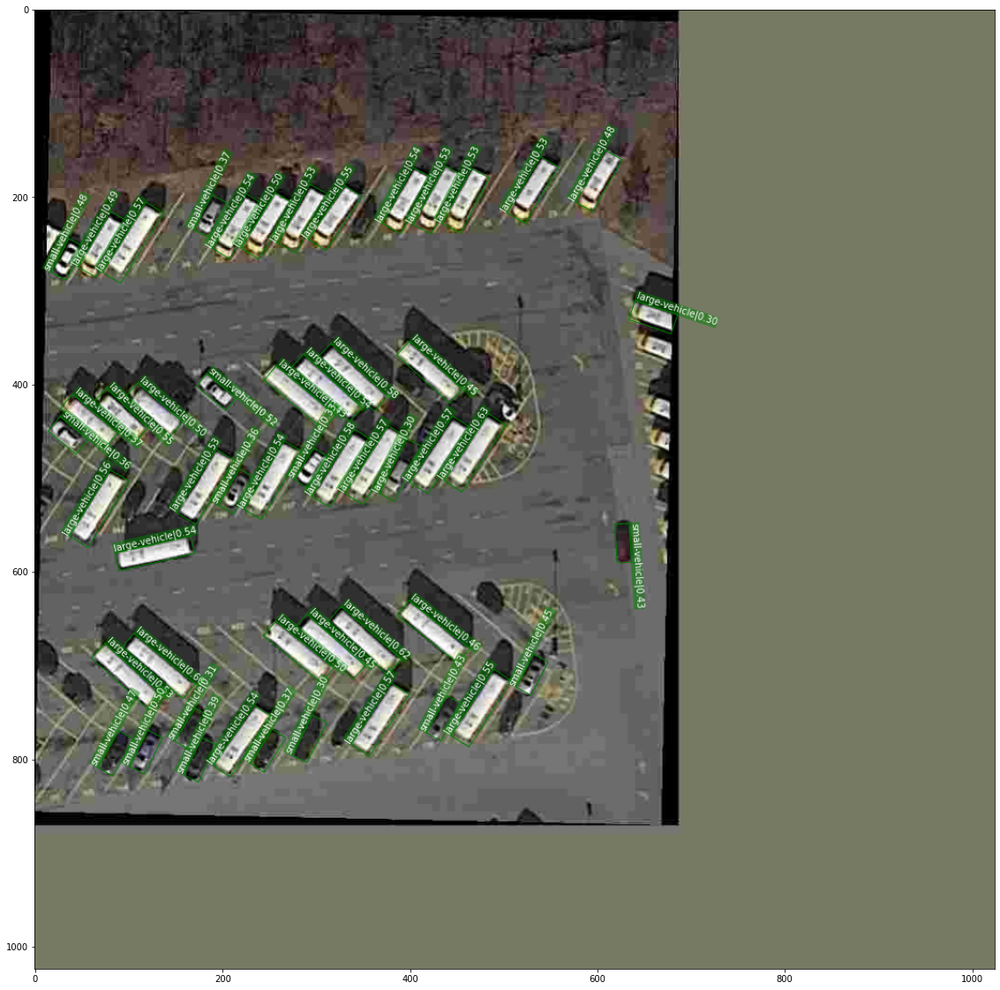

Use load_from_local loader


### NUMBER: 2517 , IMG_ID: P0199_0001

### INFERENCE, AP = 0.8124793767929077

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|0|0|0|
|swimming-pool|0|0|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|0|0|0|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|23|2|13|
|baseball-diamond|0|0|0|
|tennis-court|15|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|0|0|

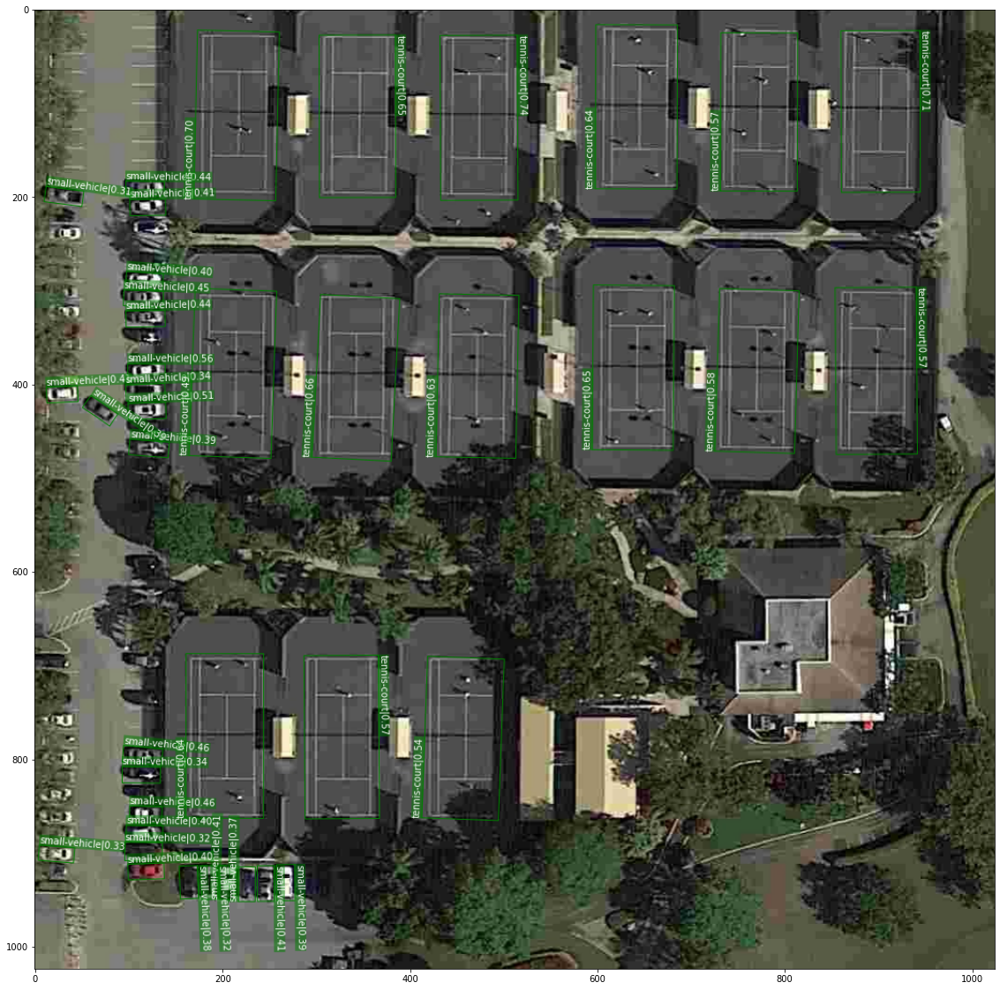

Use load_from_local loader


### NUMBER: 1433 , IMG_ID: P0715_0001

### INFERENCE, AP = 0.13636364042758942

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|0|0|0|
|swimming-pool|0|0|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|4|2|7|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|0|0|0|
|baseball-diamond|0|0|0|
|tennis-court|0|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|1|6|

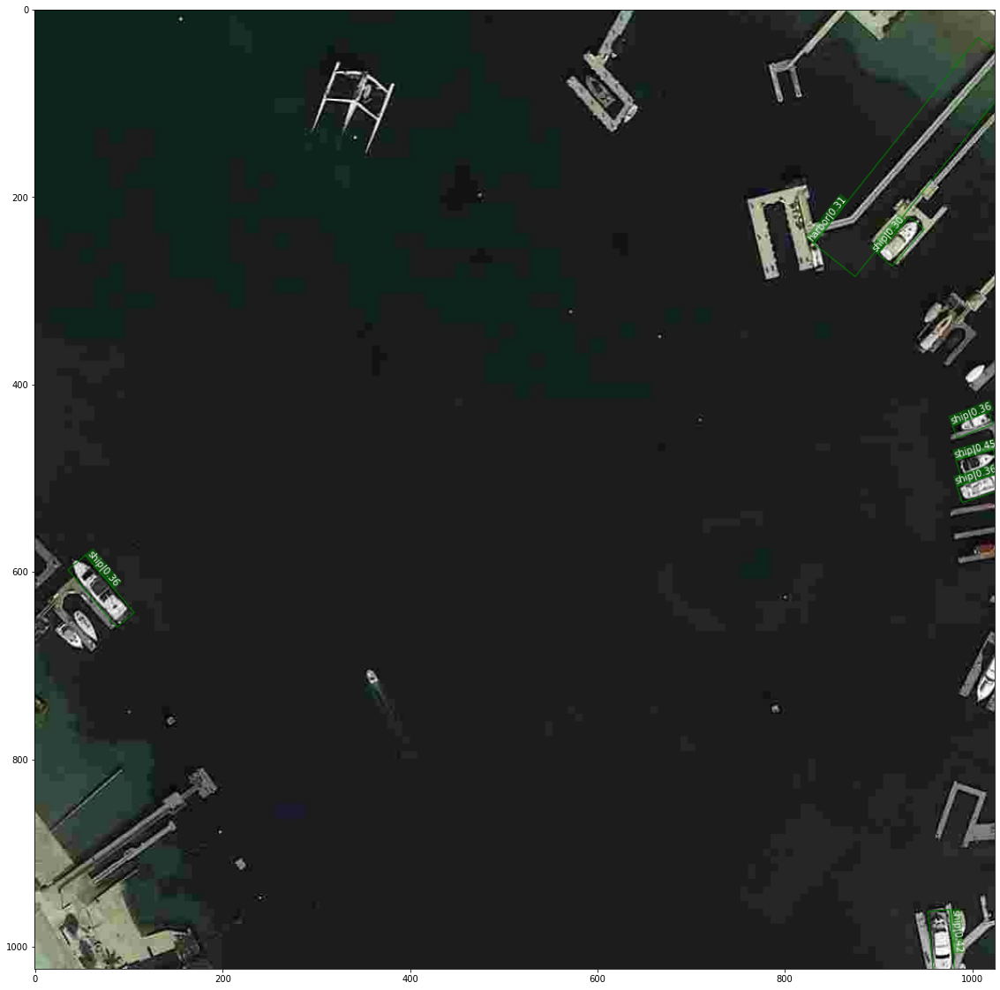

Use load_from_local loader


### NUMBER: 6 , IMG_ID: P2027_0004

### INFERENCE, AP = 0.385026752948761

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|34|2|45|
|swimming-pool|0|0|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|0|0|0|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|2|2|1|
|baseball-diamond|0|0|0|
|tennis-court|0|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|0|0|

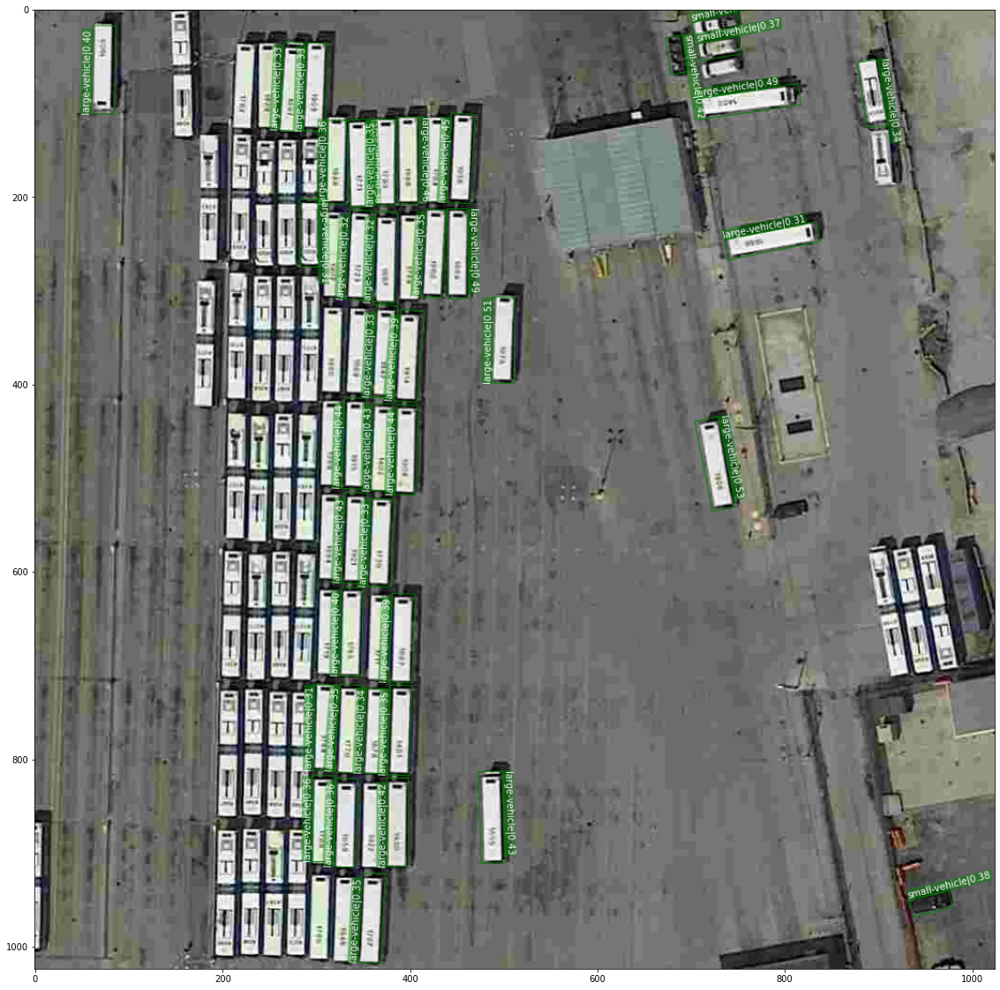

Use load_from_local loader


### NUMBER: 100 , IMG_ID: P0725_0000

### INFERENCE, AP = 0.7272727489471436

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|0|0|0|
|swimming-pool|0|1|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|7|0|3|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|8|0|5|
|baseball-diamond|0|0|0|
|tennis-court|0|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|9|0|1|

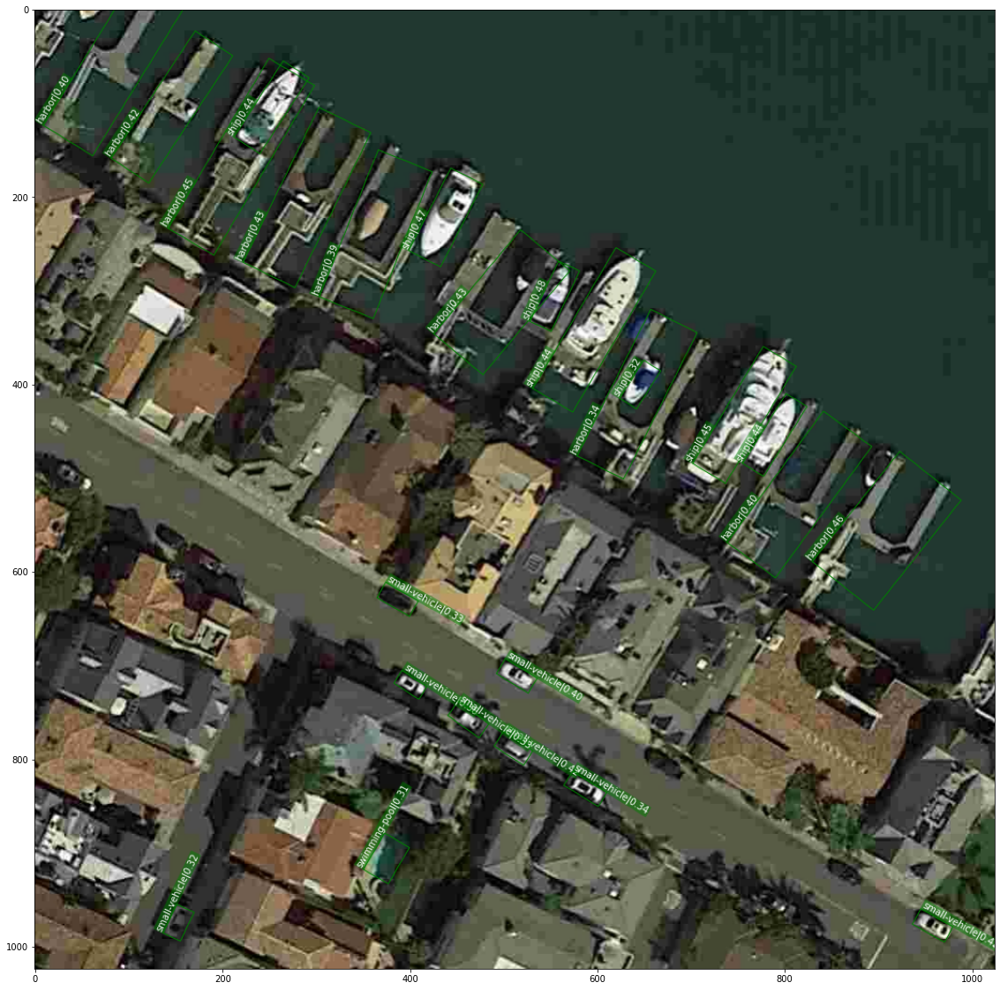

Use load_from_local loader


### NUMBER: 222 , IMG_ID: P1397_0010

### INFERENCE, AP = 1.0

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|0|0|0|
|swimming-pool|0|0|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|39|0|0|
|ship|0|0|0|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|0|0|0|
|baseball-diamond|0|0|0|
|tennis-court|0|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|0|0|

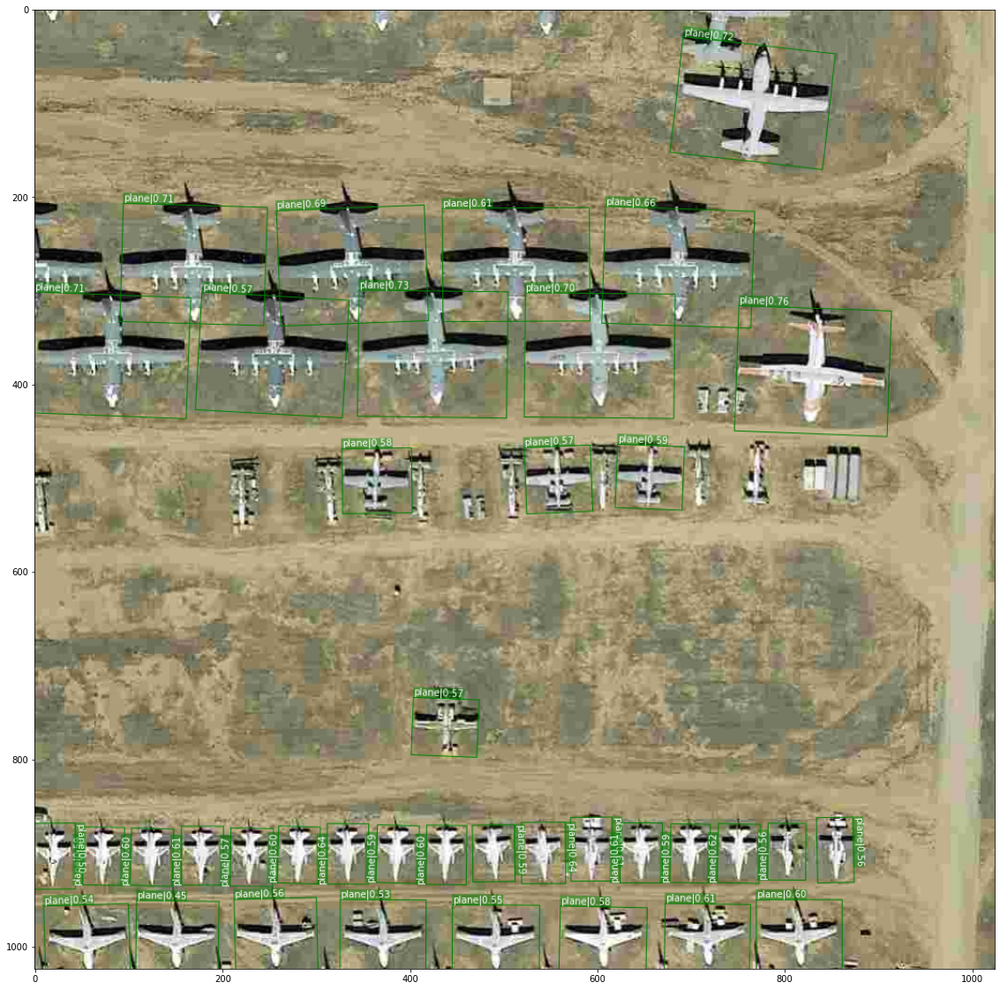

Use load_from_local loader


### NUMBER: 888 , IMG_ID: P0660_0001

### INFERENCE, AP = 0.6060605645179749

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|0|0|0|
|swimming-pool|0|1|1|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|0|0|0|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|7|1|0|
|baseball-diamond|0|0|0|
|tennis-court|4|0|1|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|0|0|

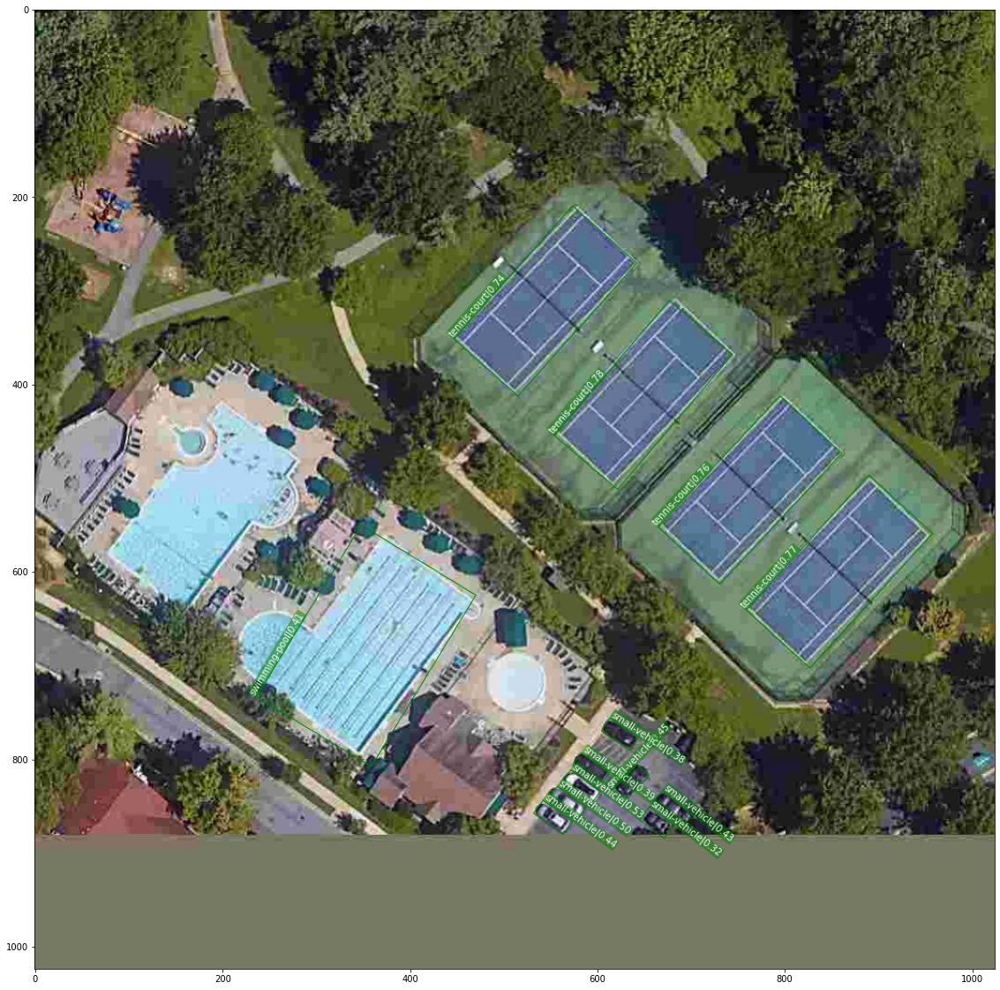

Use load_from_local loader


### NUMBER: 1522 , IMG_ID: P0375_0000

### INFERENCE, AP = 0.9483065605163574

|CLASS|TP|FP|FN|
|---|---|---|---|
|large-vehicle|0|1|0|
|swimming-pool|0|0|0|
|helicopter|0|0|0|
|bridge|0|0|0|
|plane|0|0|0|
|ship|0|0|0|
|soccer-ball-field|0|0|0|
|basketball-court|0|0|0|
|ground-track-field|0|0|0|
|small-vehicle|50|1|1|
|baseball-diamond|0|0|0|
|tennis-court|5|0|0|
|roundabout|0|0|0|
|storage-tank|0|0|0|
|harbor|0|0|0|

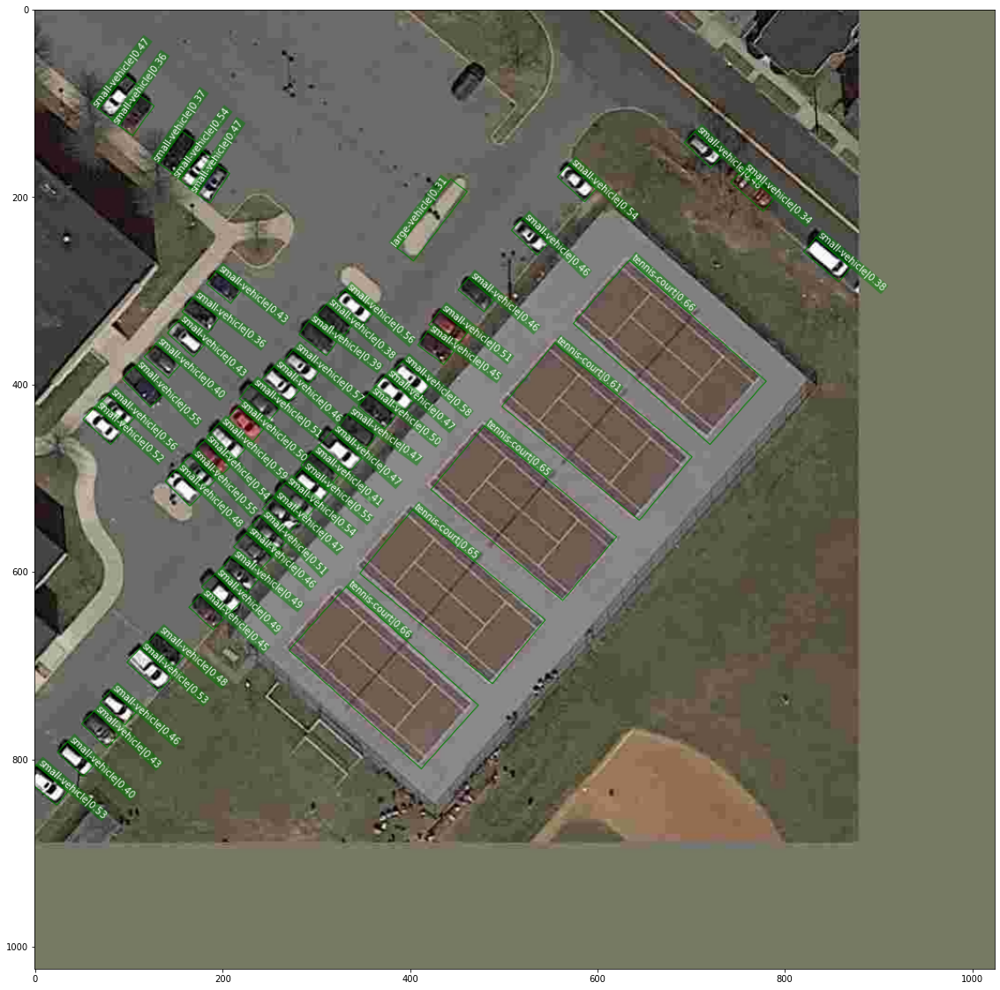

In [3]:
var, wanted_value = 'quality', '10'
CONF_THRES = 0.3
iou_thr = 0.5

experiment_id = '1'
tracking_uri = 'file:///work/mlruns'
mlflow.set_tracking_uri( tracking_uri )

for model_name in [
    'fcos',
    # 'rcnn'
]:

    for run in mlflow.search_runs([experiment_id],output_format='list'):

        if var not in run.data.params:
            continue

        value = run.data.params[var]

        if value!=wanted_value:
            continue

        if run.data.params['model']!=model_name:
            continue

        artifact_path = run.info.artifact_uri.replace('file://','')
        display(Markdown(f'__________________________________________'))
        display(Markdown(f'# model: {model_name} - {var}: {value}'))
        for imgid in [
            639,
            1927,
            1465,
            2517,
            1433,
            6,
            100,
            222,
            888,
            1522
        ]:
            result, annots = plot_20_samples(artifact_path,i=imgid)

